# GradCam Visualization

## Loading Data

In [2]:
import torch
from torch import nn
from torch.utils import data
from torchvision import transforms, datasets, models
import json

import matplotlib.pyplot as plt
import numpy as np
import math

import plotly.io as pio
pio.renderers.default = "png"
from PIL import Image as PilImage
from omnixai.data.image import Image
from omnixai.explainers.vision.specific.gradcam.pytorch.gradcam import GradCAM

In [3]:
test_root_dir= "Path to your root directory" # Example: "../../Project/GastroVision22/test"
model_path = "Path to your best model" # Example: "./C_22_32.pth"

In [4]:
n_classes=22  # number of classes used for training
batch_size=32

In [5]:
####################################
# Training
####################################

trans={    
    # Test does not use augmentation
    'test':
    transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
    ]),
}

In [6]:
###########################
# Checking if GPU is used
###########################

use_cuda=torch.cuda.is_available()
use_mps = torch.backends.mps.is_available()
device=torch.device("cuda:0" if use_cuda else "mps" if use_mps else "cpu")
device = "cpu" 
device

'cpu'

In [7]:
#Initialize model
print('Best model path:{}'.format(model_path))
denseNet_model= models.densenet121(weights=False).to(device)

n_inputs = denseNet_model.classifier.in_features
denseNet_model.classifier = nn.Sequential(
              nn.Linear(n_inputs, n_classes),               
              nn.LogSoftmax(dim=1))

checkpoint=torch.load(model_path,map_location=device)   # loading best model
# change name of model dictionary key as per your model key defined while saving the model.
denseNet_model.load_state_dict(checkpoint['model_state_dict'])
denseNet_model.to(device)

Best model path:./C_22_32.pth


Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [8]:
#Test Data Generator
test_dataset= datasets.ImageFolder(test_root_dir,transform=trans['test'])
test_generator=data.DataLoader(test_dataset,batch_size, shuffle=True)
print('Number of Test set images:{}'.format(len(test_dataset)))

Number of Test set images:1586


In [9]:
class_names = test_dataset.classes
print("Total Classes: ", len(class_names))
print(class_names)

Total Classes:  22
['Accessory tools', "Barrett's esophagus", 'Blood in lumen', 'Cecum', 'Colon diverticula', 'Colon polyps', 'Colorectal cancer', 'Duodenal bulb', 'Dyed-lifted-polyps', 'Dyed-resection-margins', 'Esophagitis', 'Gastric polyps', 'Gastroesophageal_junction_normal z-line', 'Ileocecal valve', 'Mucosal inflammation large bowel', 'Normal esophagus', 'Normal mucosa and vascular pattern in the large bowel', 'Normal stomach', 'Pylorus', 'Resected polyps', 'Retroflex rectum', 'Small bowel_terminal ileum']


## Data Visualization

## Implementing GradCam

In [13]:
batch = next(iter(test_generator))
images, labels = batch

tensor_images = torch.stack(list(unique_instances.values()))
tensor_labels = torch.stack(list(unique_instances.keys()))

background = tensor_images
test_images = tensor_images
test_labels = tensor_labels

In [27]:
denseNet_model.features.denseblock4

_DenseBlock(
  (denselayer1): _DenseLayer(
    (norm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (denselayer2): _DenseLayer(
    (norm1): BatchNorm2d(544, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv1): Conv2d(544, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (denselayer3): _DenseLayer(
    (norm1): BatchNorm2d(576, eps=1e-05, moment

## Loading all images to Pytorch PIL Image

In [16]:
imgs = []
for img in tensor_images:
    imgs.append(np.array(transforms.ToPILImage()(img)))

# pil_img = np.array([, np.array(transforms.ToPILImage()(tensor_images[1]))])
imgs = np.array(imgs)
imgs.shape

(22, 224, 224, 3)

In [17]:
imgs = Image(np.array(imgs), batched=True, channel_last=True)

In [18]:
preprocess = lambda ims: torch.stack([trans['test'](im.to_pil()) for im in ims])

### Visualizing Features

In [19]:
explainer = GradCAM(
    model=denseNet_model,
    target_layer=denseNet_model.features,
    preprocess_function=preprocess,
    mode="classification"
)
# Explain the top label
explanations = explainer.explain(imgs)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


There are too many instances (22 > 10), so only the first 10 instances are plotted.


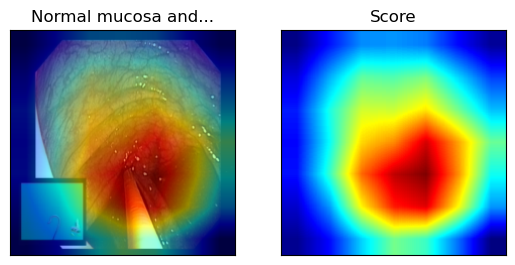

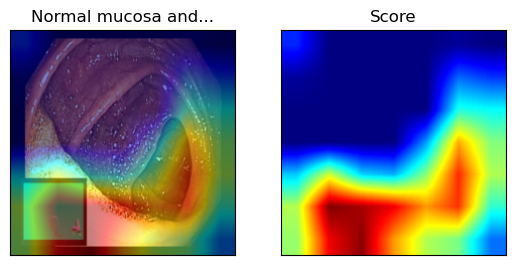

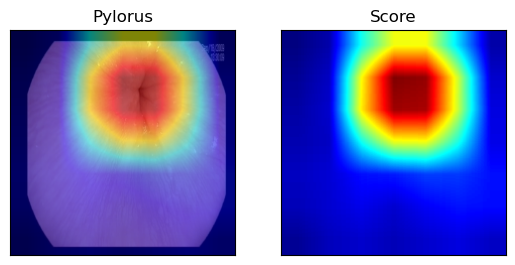

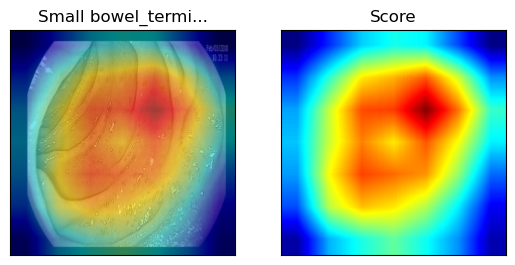

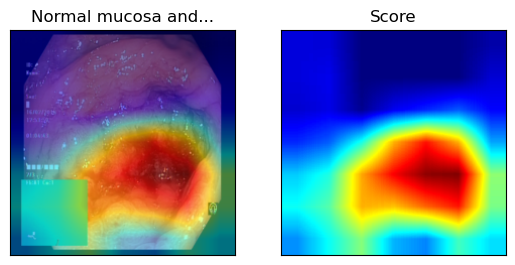

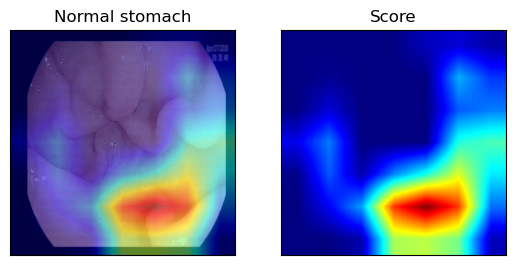

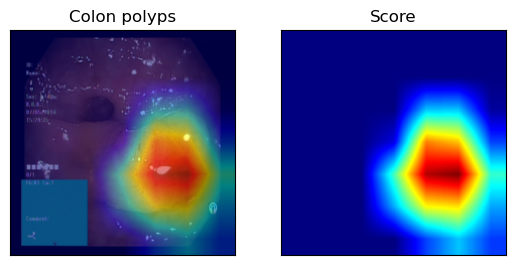

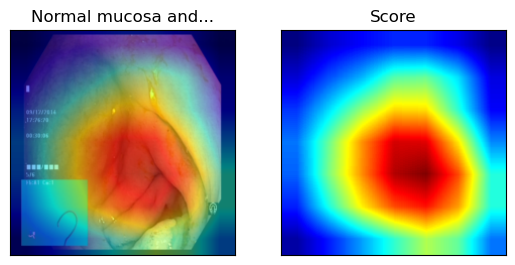

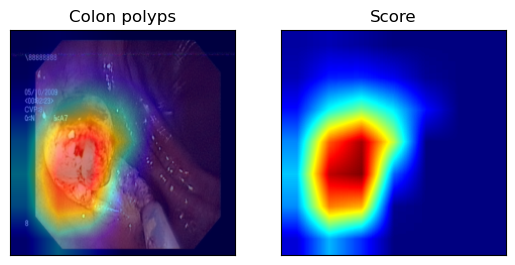

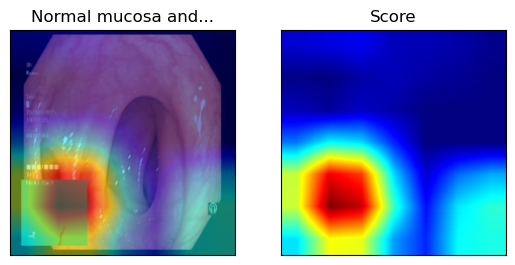

In [20]:
class_labels = [truncate_title(i, 20) for i in class_names]
fig = explanations.plot(class_names=class_labels)

### Visualize Block 1

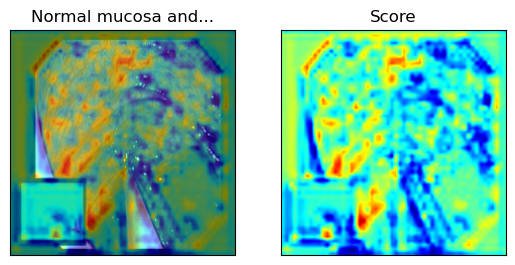

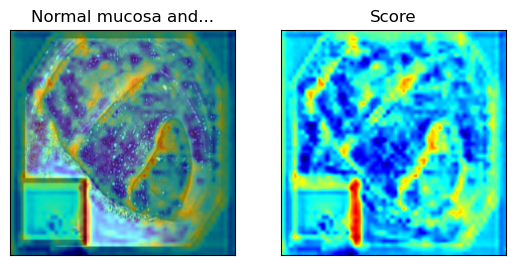

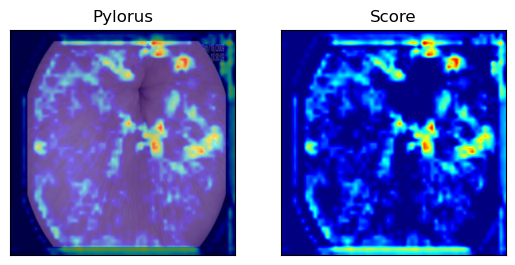

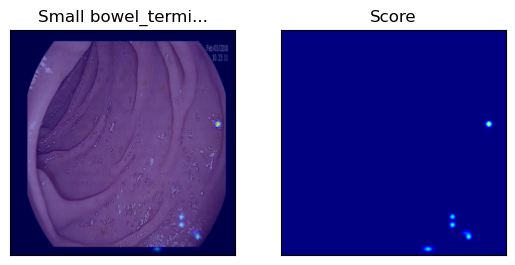

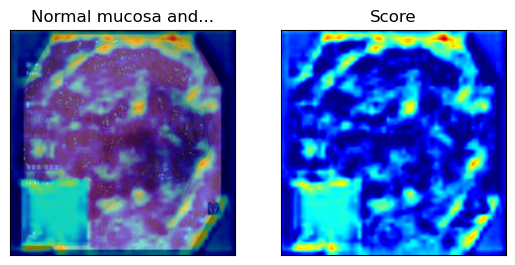

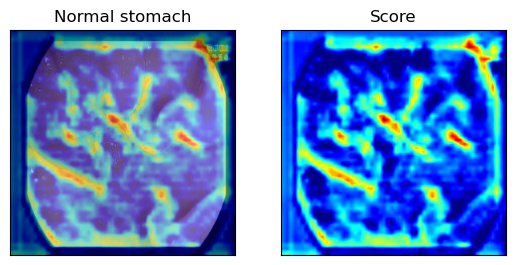

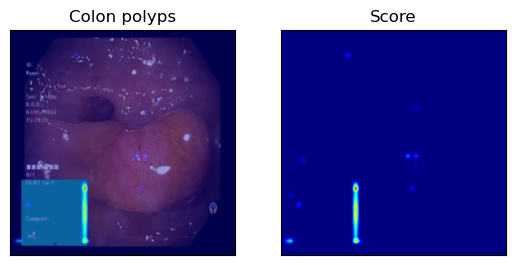

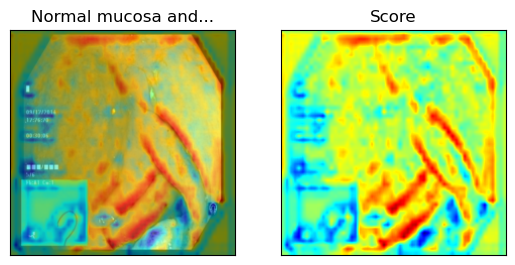

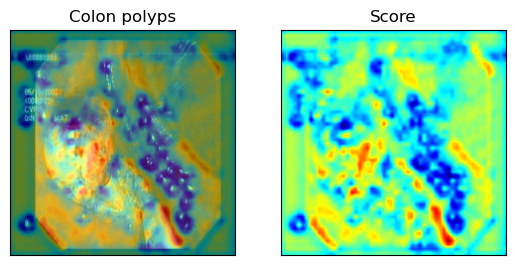

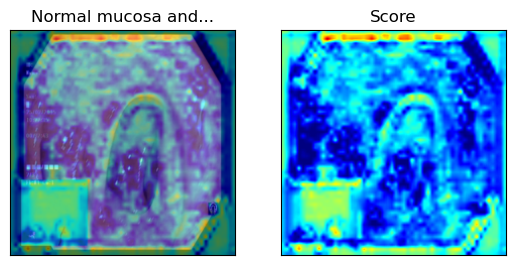

In [29]:
explainer = GradCAM(
    model=denseNet_model,
    target_layer=denseNet_model.features.denseblock1,
    preprocess_function=preprocess,
    mode="classification"
)
# Explain the top label
explanations = explainer.explain(imgs)

class_labels = [truncate_title(i, 20) for i in class_names]
fig = explanations.plot(class_names=class_labels)

### Visualize Block 2

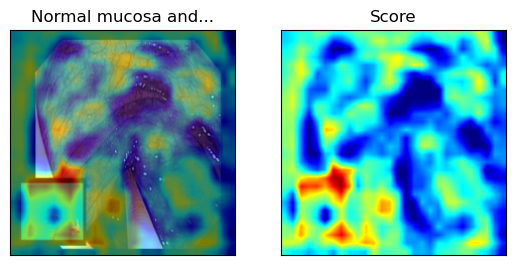

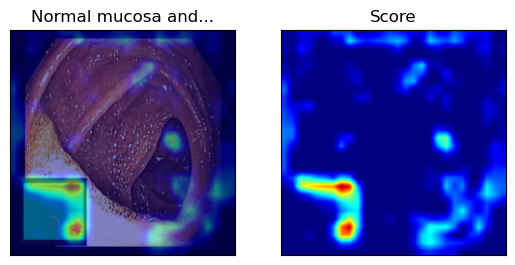

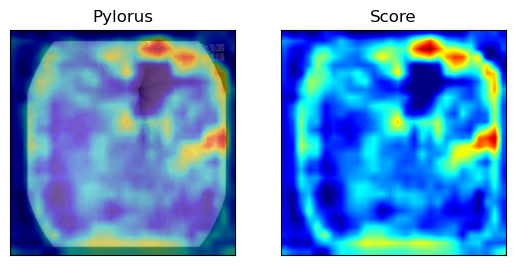

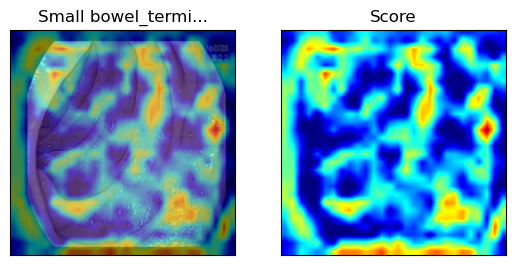

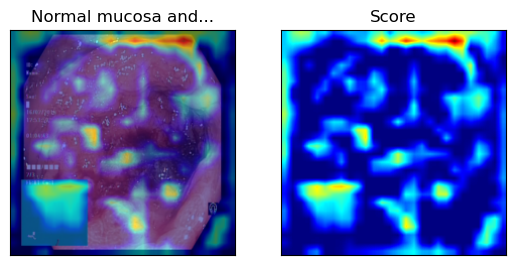

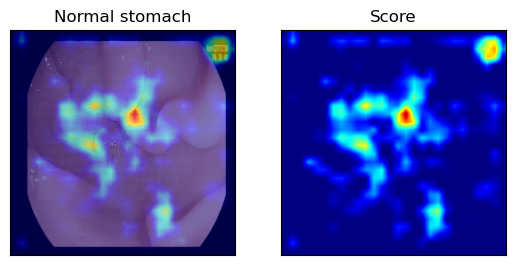

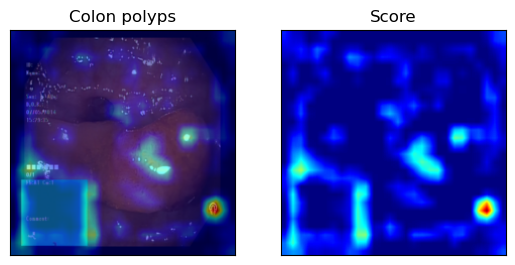

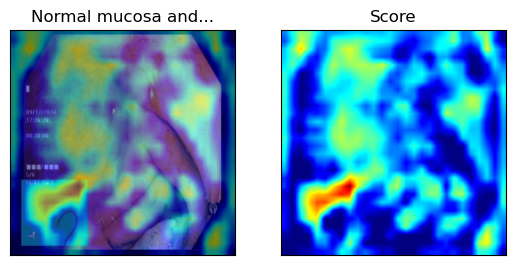

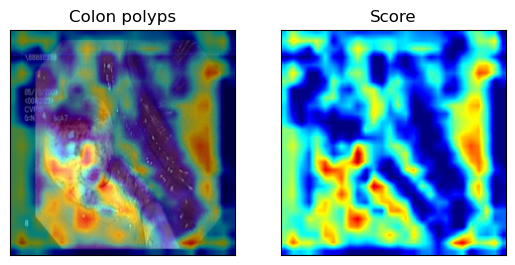

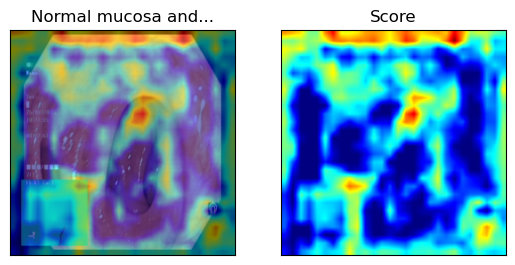

In [30]:
explainer = GradCAM(
    model=denseNet_model,
    target_layer=denseNet_model.features.denseblock2,
    preprocess_function=preprocess,
    mode="classification"
)
# Explain the top label
explanations = explainer.explain(imgs)

class_labels = [truncate_title(i, 20) for i in class_names]
fig = explanations.plot(class_names=class_labels)

### Visualize Block 3

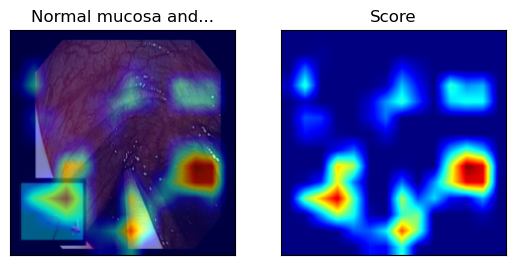

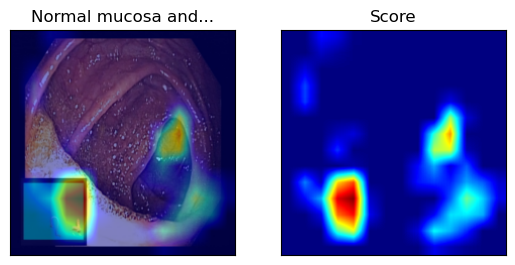

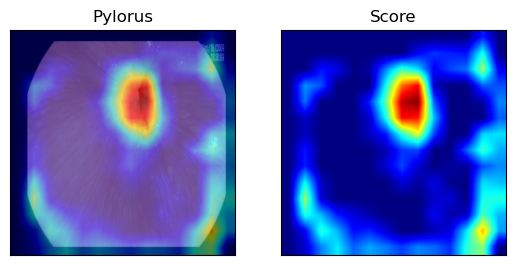

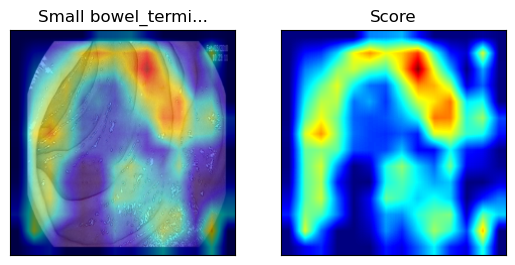

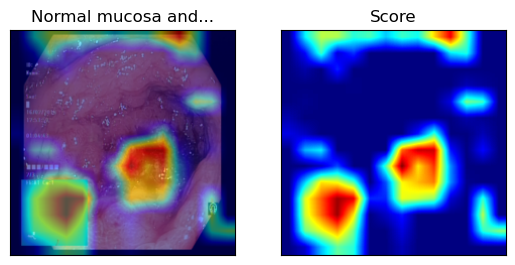

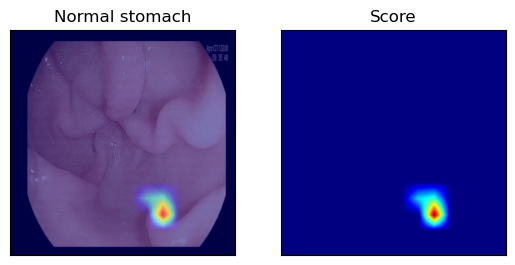

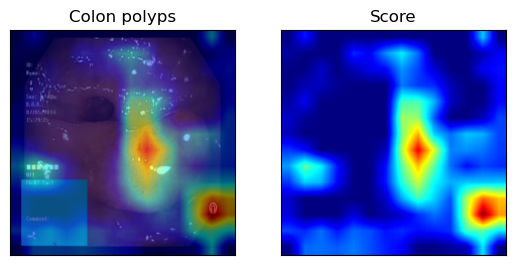

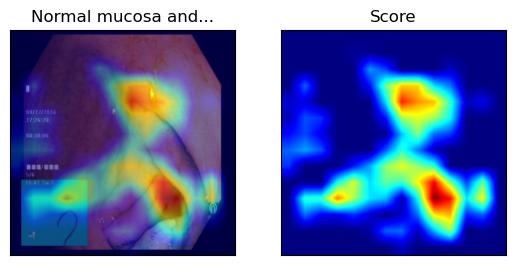

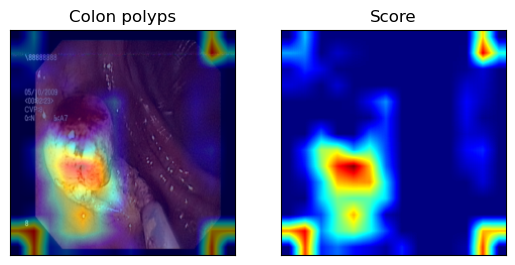

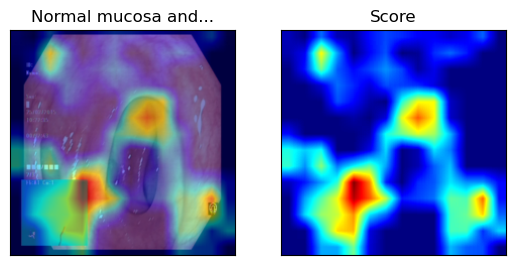

In [31]:
explainer = GradCAM(
    model=denseNet_model,
    target_layer=denseNet_model.features.denseblock3,
    preprocess_function=preprocess,
    mode="classification"
)
# Explain the top label
explanations = explainer.explain(imgs)

class_labels = [truncate_title(i, 20) for i in class_names]
fig = explanations.plot(class_names=class_labels)

### Visualize Block 4

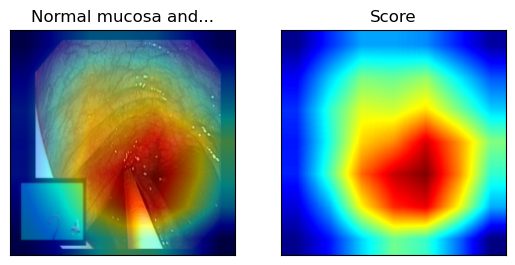

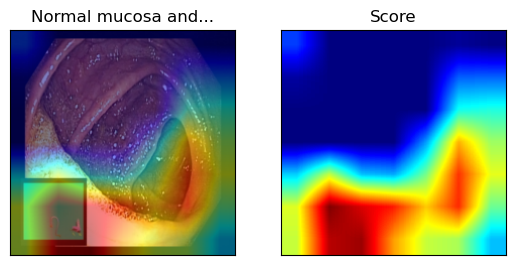

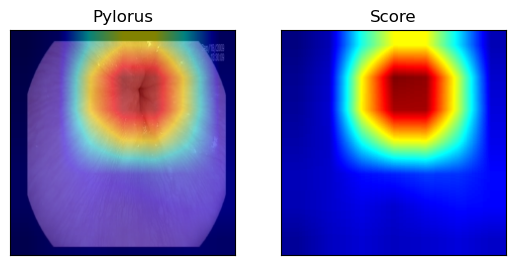

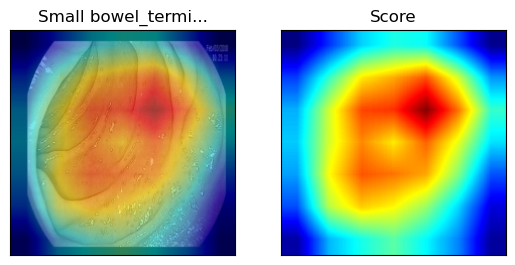

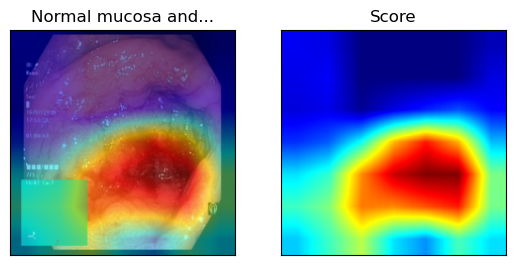

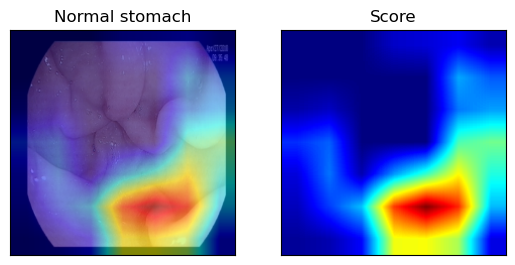

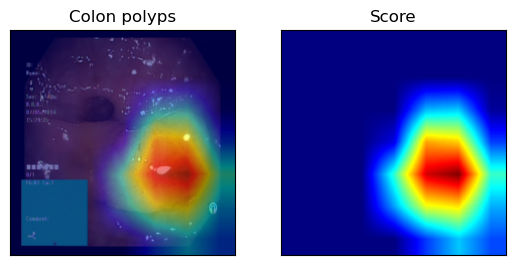

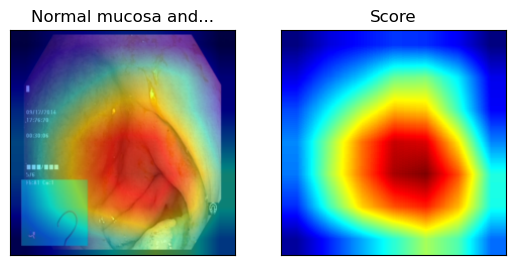

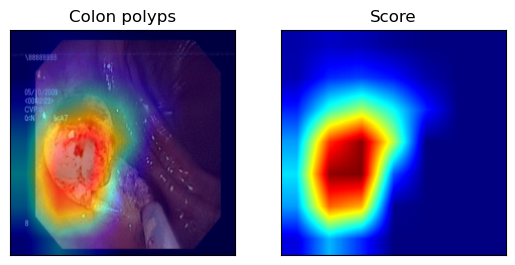

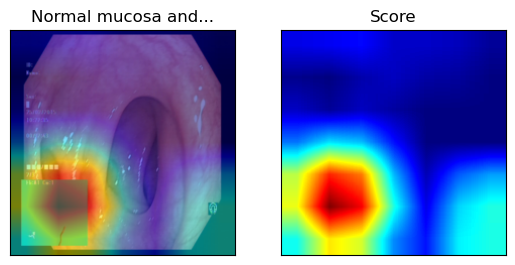

In [32]:
explainer = GradCAM(
    model=denseNet_model,
    target_layer=denseNet_model.features.denseblock4,
    preprocess_function=preprocess,
    mode="classification"
)
# Explain the top label
explanations = explainer.explain(imgs)

class_labels = [truncate_title(i, 20) for i in class_names]
fig = explanations.plot(class_names=class_labels)

In [21]:
ex = explanations.get_explanations(None)
ex[0].keys()

dict_keys(['image', 'scores', 'target_label'])

In [22]:
class_names[ex[0]['target_label']]

'Normal mucosa and vascular pattern in the large bowel'

Classes computation completed found classes:  22
Plotting your classes...


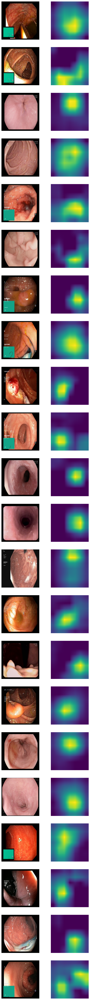

In [24]:
data = ex

def rescale(im):
    min_val, max_val = np.min(im), np.max(im)
    im = (im - min_val) / (max_val - min_val + 1e-8) * 255
    if im.ndim == 2:
        im = np.tile(np.expand_dims(im, axis=-1), (1, 1, 3))
    return im.astype(np.uint8)

# Function to plot one instance from each class
def plot_grad_results(data):
    # Plot the images
    num_classes = len(data)
    print("Classes computation completed found classes: ", num_classes)
    print("Plotting your classes...")
    
    # Calculate the number of rows and columns
    num_rows = num_classes
    num_cols = 2
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 4 * num_rows), squeeze=False)

    count = 0
    for i, item in enumerate(data):
        # Assuming images are normalized tensors
        image = item['image']
#         score = np.abs(rescale(item["scores"]) - item["image"])
        score = item['scores']
        axes[i, 0].imshow(image)
        axes[i, 0].axis('off')
        axes[i, 1].imshow(score)
        axes[i, 1].axis('off')
        
#         class_title = truncate_title(class_names[class_label])
#         axes[i, j].set_title(f'{class_title}' if class_label < num_classes else '')

    plt.show()

# Plot all images in the data array
plot_grad_results(data)